<a href="https://colab.research.google.com/github/garunAMT/Computer-Vision/blob/main/computer_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

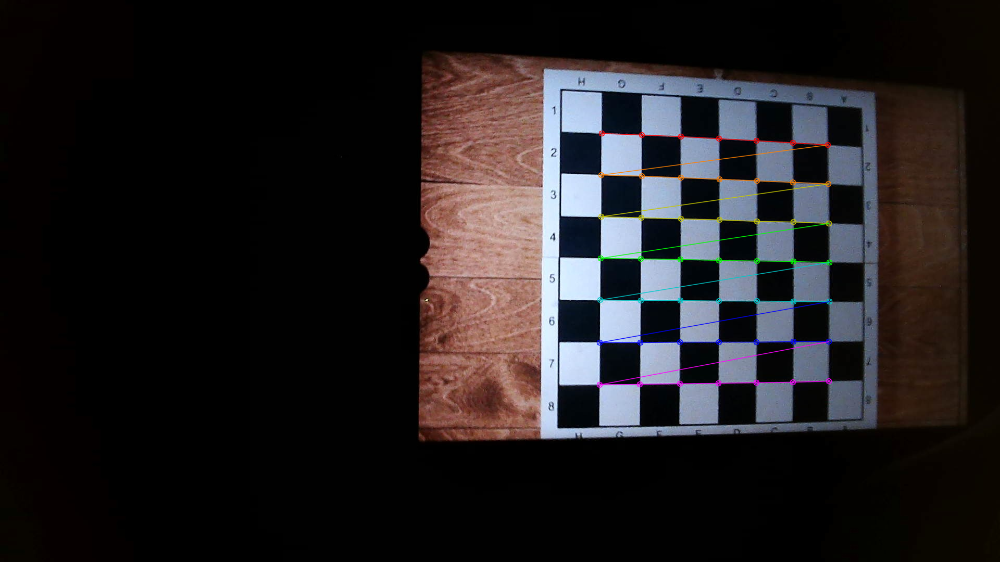

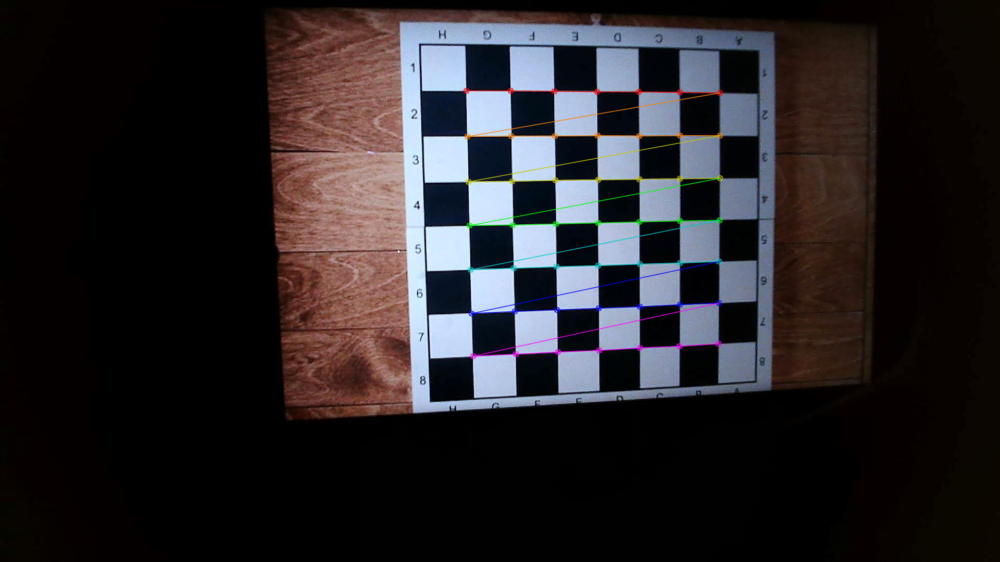

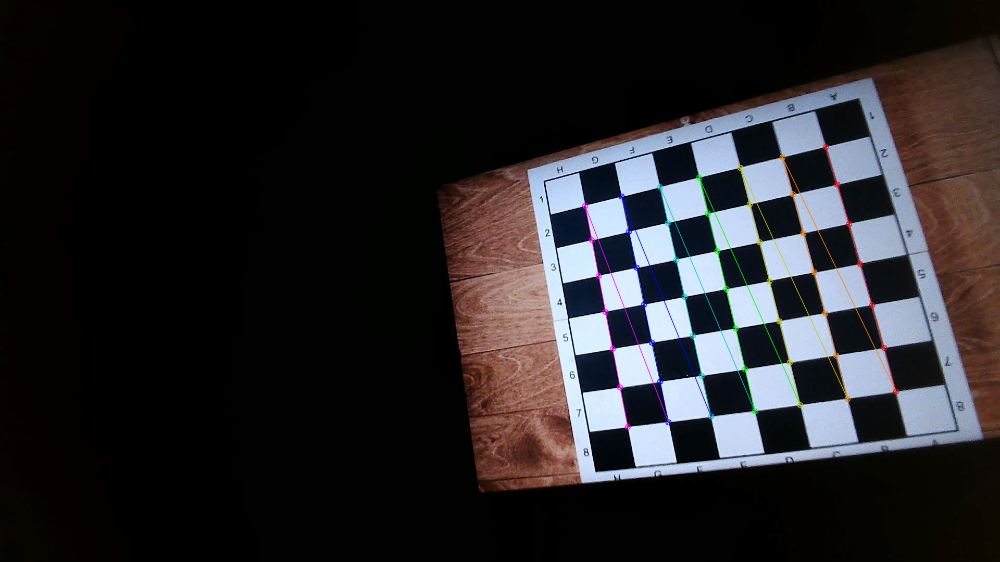

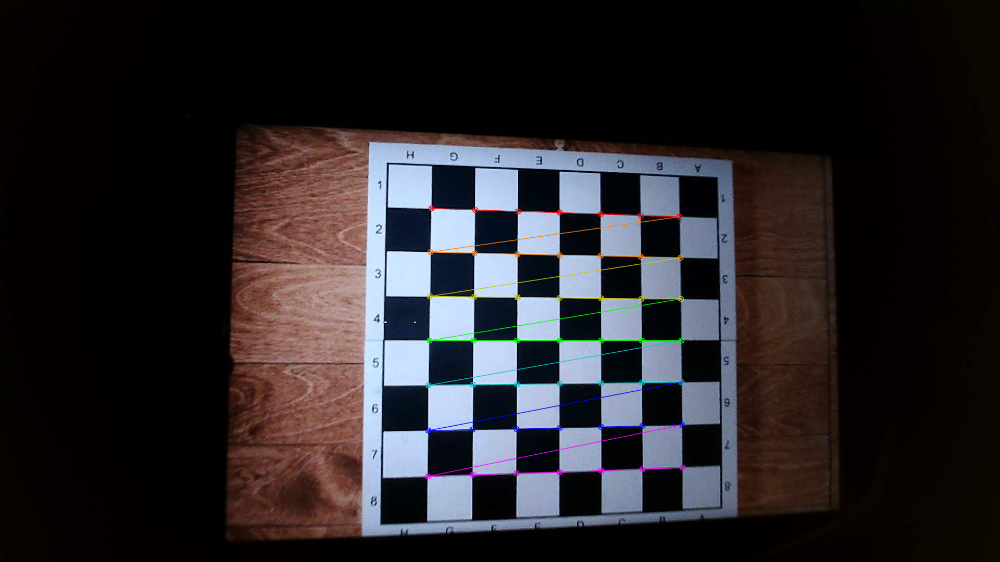

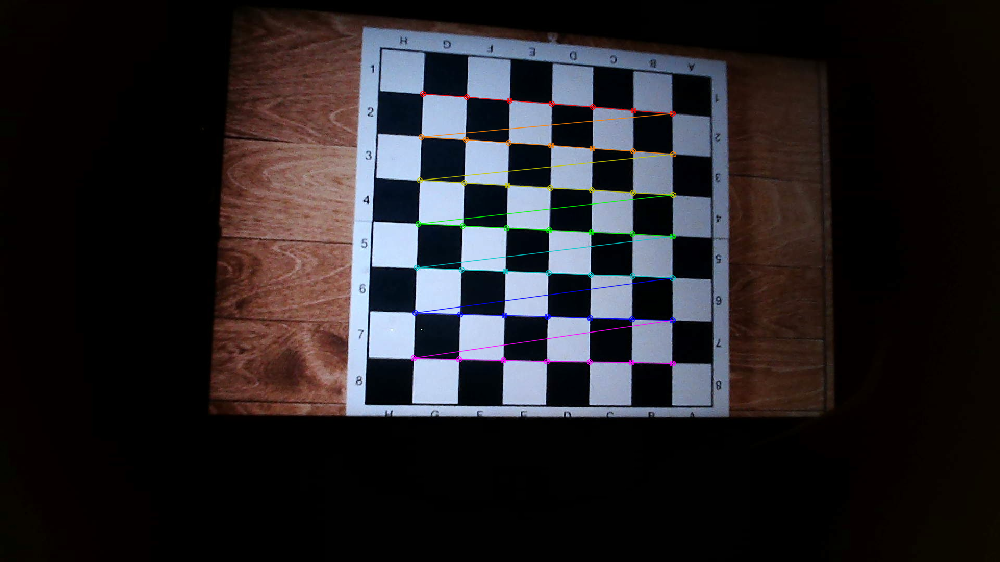

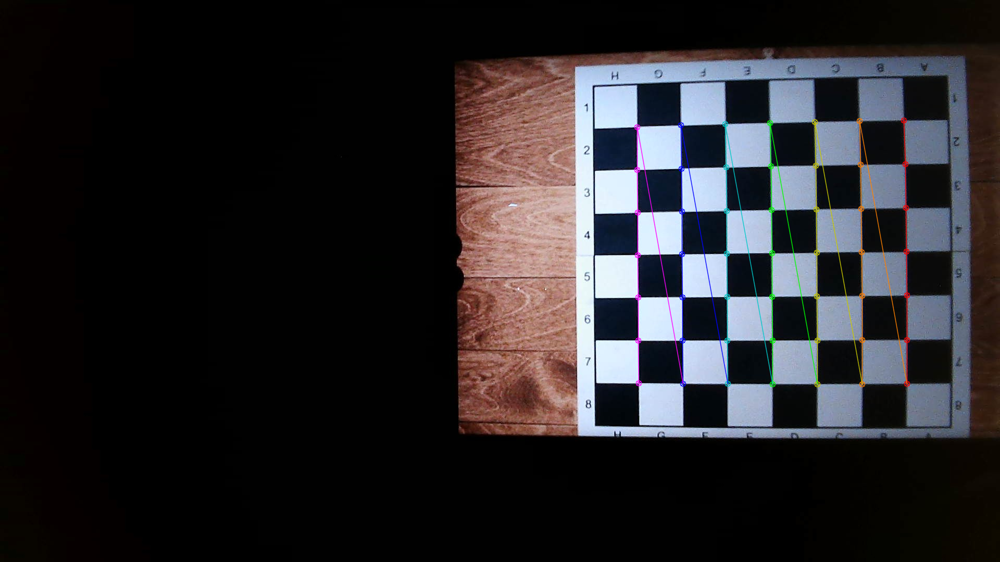

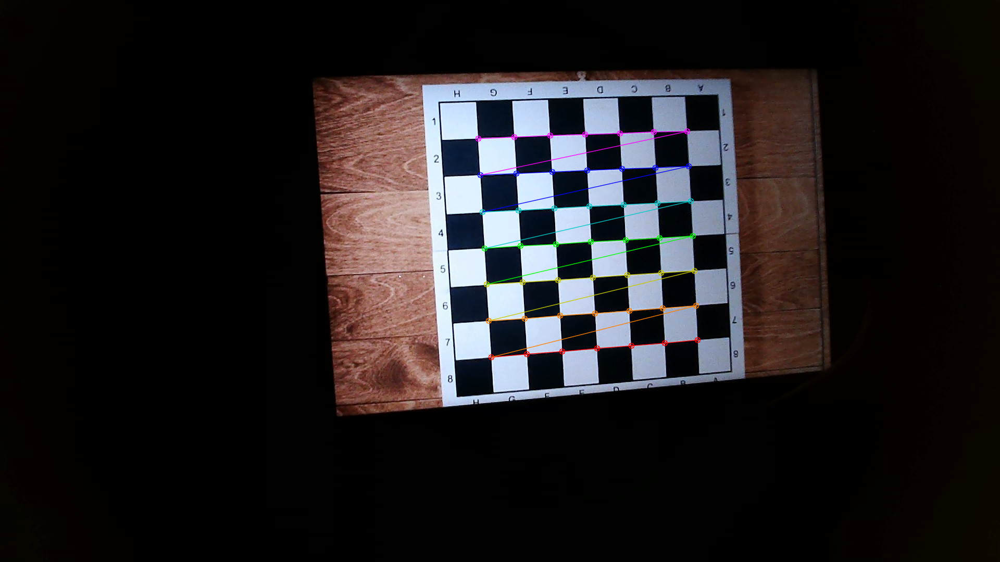

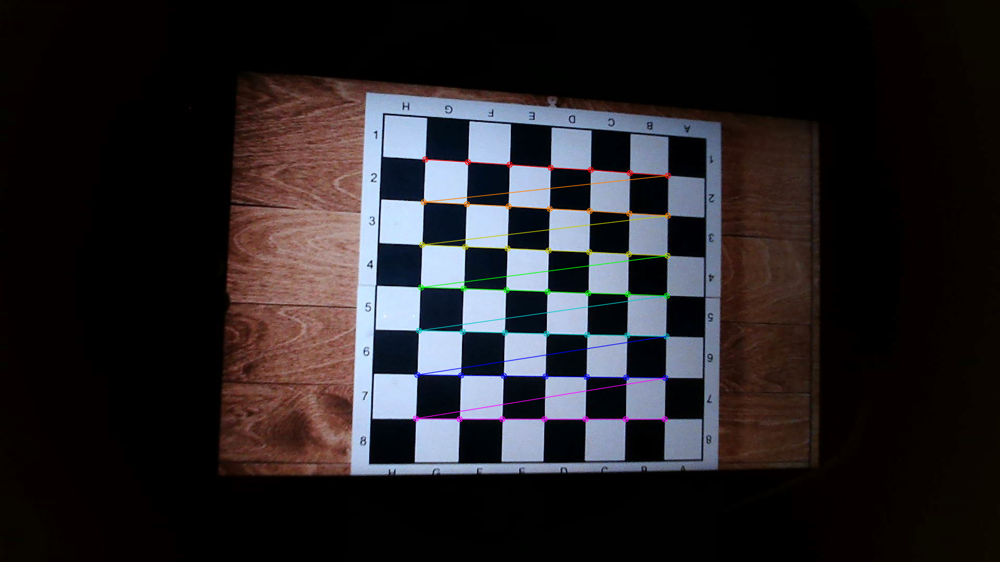

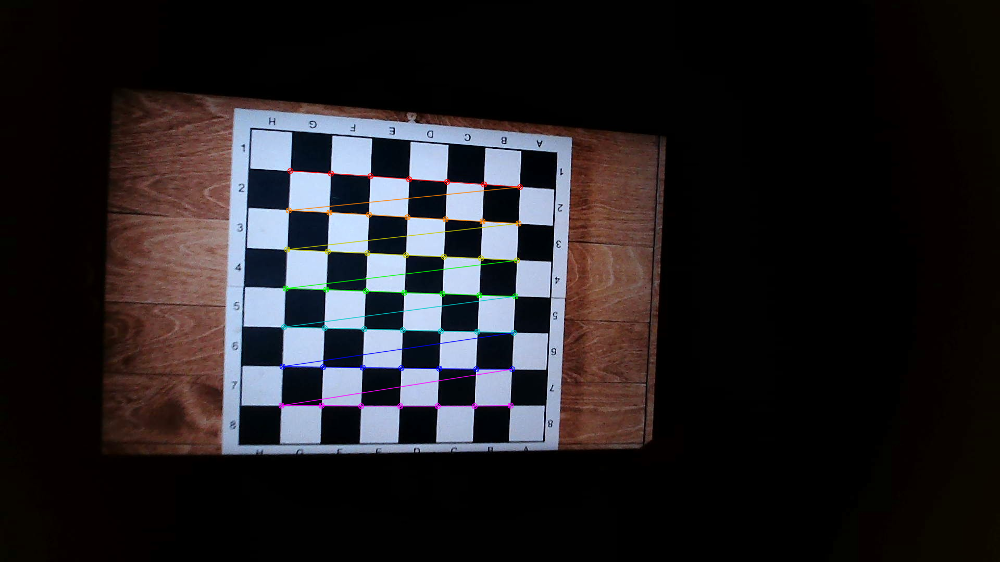

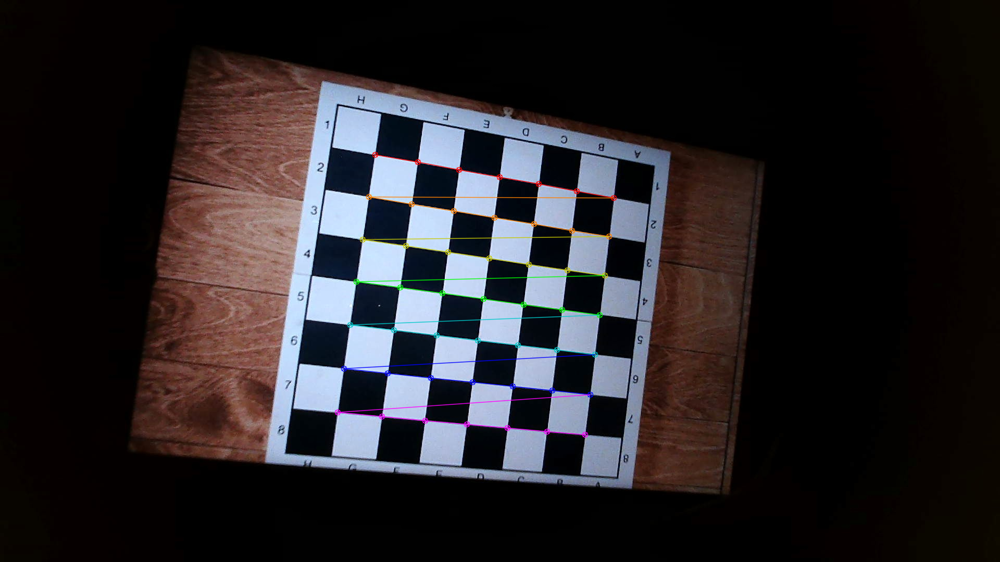

In [ ]:
import numpy as np
import cv2
import glob
from google.colab.patches import cv2_imshow

# Define the dimensions of the chessboard
chessboard_size = (7, 7)  # total number of squares - 1
square_size = 0.020  # Size of a square in meters

# Prepare object points (0,0,0), (1,0,0), etc
objp = np.zeros((chessboard_size[0] * chessboard_size[1], 3), np.float32)
objp[:, :2] = np.mgrid[0:chessboard_size[0], 0:chessboard_size[1]].T.reshape(-1, 2)
objp *= square_size

# Arrays to store object points and image points
objpoints = []  # used for storing 3D points in real world space
imgpoints = []  # used for storing 2D points in image plane

# Load dataset images.
# NOTE: Please upload the dataset folder before running.
images = glob.glob('calibration_images/*.jpg')

for fname in images:

    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # print(gray)

    # Find chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, chessboard_size, None)

    if ret:
        objpoints.append(objp)
        corners_refined = cv2.cornerSubPix(gray, corners, (11, 11), (-1, -1), (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001))
        imgpoints.append(corners_refined)

        # Drawing and displaying the corners of chessboard
        cv2.drawChessboardCorners(img, chessboard_size, corners_refined, ret)
        cv2_imshow(img) # this is colab specific as cv2.imshow does not works in colab
        cv2.waitKey(500)

cv2.destroyAllWindows() #clears the memory

In [ ]:
# Extract extrinsic and Intrinsic Parameteres
ret, matrix, dist, rot_vecs, trans_vecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)

if ret:

    print("Intrinsic Parameters (Camera Matrix):")
    print(matrix)


    print("\nDistortion Coefficients:")
    print(dist)


    print("\nExtrinsic Parameters (Rotation Vectors):")
    for i, rot_vec in enumerate(rot_vecs):
        print(f"Image {i+1}:")
        print(rot_vec)


    print("\nExtrinsic Parameters (Translation Vectors):")
    for i, trans_vec in enumerate(trans_vecs):
        print(f"Image {i+1}:")
        print(trans_vec)


else:

    print("Calibration failed.")

Intrinsic Parameters (Camera Matrix):
[[1.09135957e+03 0.00000000e+00 9.10468769e+02]
 [0.00000000e+00 1.08552556e+03 5.25085462e+02]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]

Distortion Coefficients:
[[ 0.01654622 -0.12522086 -0.00280515 -0.00084338  0.08074434]]

Extrinsic Parameters (Rotation Vectors):
Image 1:
[[-0.02736142]
 [-0.12126449]
 [ 0.01457975]]
Image 2:
[[ 0.06570014]
 [-0.11780783]
 [-0.02784931]]
Image 3:
[[0.11294213]
 [0.41642956]
 [1.37209742]]
Image 4:
[[-0.06532442]
 [-0.13916014]
 [ 0.01348387]]
Image 5:
[[-0.07950501]
 [-0.12668474]
 [ 0.03380206]]
Image 6:
[[0.07510337]
 [0.08902417]
 [1.5630618 ]]
Image 7:
[[-0.18543079]
 [-0.0299112 ]
 [ 3.07400236]]
Image 8:
[[-0.05801494]
 [-0.14058165]
 [ 0.03562759]]
Image 9:
[[ 0.00504446]
 [-0.1742028 ]
 [ 0.04162064]]
Image 10:
[[-0.05037906]
 [-0.19673096]
 [ 0.13751212]]

Extrinsic Parameters (Translation Vectors):
Image 1:
[[ 0.06057004]
 [-0.06717197]
 [ 0.27112888]]
Image 2:
[[-0.00366948]
 [-0.08145475]
 

In [ ]:
# extracting all intrinsic property like f_x, f_y, p_x, p_y & skew

if ret:

    print("Intrinsic Parameters (Camera Matrix):")
    print(matrix)

    # Extract focal lengths
    fx = matrix[0,0]
    fy = matrix[1,1]
    print(f"\nfocal length x: {fx}")
    print(f"focal length y: {fy}")

    # Extract principal point
    px = matrix[0,2]
    py = matrix[1,2]
    print(f"\nprincipal point x: {px}")
    print(f"principal point y: {py}")

    # Extract skew coefficient
    skew = matrix[0,1]
    print(f"\nskew: {skew}")

    print("\nDistortion Coefficients:")
dist

Intrinsic Parameters (Camera Matrix):
[[1.09135957e+03 0.00000000e+00 9.10468769e+02]
 [0.00000000e+00 1.08552556e+03 5.25085462e+02]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]

focal length x: 1091.3595699168573
focal length y: 1085.525563586525

principal point x: 910.4687688492054
principal point y: 525.0854618459598

skew: 0.0

Distortion Coefficients:


array([[ 0.01654622, -0.12522086, -0.00280515, -0.00084338,  0.08074434]])